In [1]:
import pytorch_lightning as pl
from pytorch_lightning import Trainer, loggers
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn.functional as F
from torch.optim.lr_scheduler import StepLR

from transformer_lens import HookedTransformer, HookedTransformerConfig, utils
from pathlib import Path
from pytorch_lightning.loggers import TensorBoardLogger
import os

from scipy.linalg import norm
from transformer_lens import HookedTransformer, HookedTransformerConfig, utils
import torch
import numpy as np
import plotly.express as px
import plotly.io as pio
from jaxtyping import Float, Int # Read about this library
import tqdm.auto as tqdm
import einops
from transformer_lens.utils import to_numpy
from pathlib import Path
from torch.utils.data import TensorDataset, DataLoader
from datetime import datetime
# import pytorch_lightning as pl
from functools import partial
import pandas as pd

from transformer_lens.hook_points import (
    HookedRootModule,
    HookPoint,
)  # Hooking utilities

# Utils
def line(tensor, line_labels=None, yaxis="", xaxis="", **kwargs):
    tensor = to_numpy(tensor)
    labels = {"y": yaxis, "x": xaxis}
    fig = px.line(tensor, labels=labels, **kwargs)
    if line_labels:
        for c, label in enumerate(line_labels):
            fig.data[c].name = label
    fig.layout.height = 400
    fig.show()
    

def imshow(tensor, yaxis="", xaxis="", **kwargs):
    tensor = to_numpy(tensor)
    plot_kwargs = {
        "color_continuous_scale": "RdBu",
        "color_continuous_midpoint": 0.0,
        "labels": {"x": xaxis, "y": yaxis},
    }
    plot_kwargs.update(kwargs)
    px.imshow(tensor, **plot_kwargs).show()


The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.


/home/nlp/matan_avitan/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load trained model

In [2]:
device='cpu'
def deactivate_position(model):
    model.pos_embed.W_pos.data[:] = 0.0
    model.pos_embed.W_pos.requires_grad = False
class LitTransformer(pl.LightningModule):
    def __init__(self, config, train_dataloader, val_dataloader):
        super().__init__()
        self.model = HookedTransformer(config)
        self.model.to(device)
        deactivate_position(self.model)
        print(self.model.pos_embed.W_pos.data)
        print(self.model.W_E.device)
        self._train_dataloader = train_dataloader
        self._val_dataloader = val_dataloader

    def forward(self, tokens):
        return self.model(tokens.to(device))

    def training_step(self, batch, batch_idx):
        tokens, targets = batch
        tokens = tokens.to(device)
        targets = targets .to(device)
        logits = self(tokens)
        loss = self.loss_fn(logits, targets)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        tokens, targets = batch
        logits = self(tokens)
        loss = self.loss_fn(logits, targets)
        self.log('val_loss', loss)

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=5e-5, betas=(0.9, 0.95), weight_decay=0.1)
        scheduler = StepLR(optimizer, step_size=100, gamma=0.1)
        return [optimizer], [scheduler]

    def train_dataloader(self):
        return self._train_dataloader

    def val_dataloader(self):
        return self._val_dataloader

    def loss_fn(self, logits, labels, per_token=False):
        log_probs = logits.log_softmax(-1)
        correct_log_probs = log_probs.gather(-1, labels[..., None])[..., 0]
        if per_token:
            return -correct_log_probs
        else:
            return -correct_log_probs.mean()
################ Data
class CustomDataset(TensorDataset):
    def __init__(self, tokens, targets):
        super().__init__(tokens, targets)
BASE = Path('.').resolve() 
N_CTX = 64
D_VOCAB = 64
TRAIN_RATIO = 0.8
N_BATCHES = 5_000
BATCH_SIZE = 8192
TBLOGSDIR = f'tblogs'
input_dir = Path('/home/nlp/matan_avitan/git/nopos_locating/datasets/abs_pos_pred_random_values')
train_dataset = torch.load(input_dir / 'train_dataset.pt', map_location=torch.device(device))
test_dataset = torch.load(input_dir / 'test_dataset.pt', map_location=torch.device(device))
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
################ Data
cfg = HookedTransformerConfig(
    n_layers=6,
    d_model=32,
    d_head=32,
    n_heads=1,
    d_mlp=128,
    d_vocab=D_VOCAB,
    n_ctx=N_CTX,
    act_fn='relu',
    normalization_type='LN',
    device=device,
    use_hook_mlp_in=True
)

# checkpoint_path = r"/home/nlp/matan_avitan/git/nopos_locating/models/synthetic_abs_pos_2024-08-28 00:25:20/epoch=291-step=58400.ckpt"
# checkpoint_path = r"/home/nlp/matan_avitan/git/nopos_locating/models/synthetic_abs_pos_2024-09-01 14:39:47/epoch=228-step=45800.ckpt"
checkpoint_path = r"/home/nlp/matan_avitan/git/nopos_locating/models/synthetic_abs_pos_2024-09-01 16:28:48/epoch=286-step=57400.ckpt"

lit_model = LitTransformer.load_from_checkpoint(checkpoint_path, config=cfg, train_dataloader=train_loader, val_dataloader=test_loader)
lit_model.to(device)

/home/nlp/matan_avitan/.tmp/ipykernel_3200017/805360121.py:64: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  train_dataset = torch.load(input_dir / 'train_dataset.pt', map_l

Moving model to device:  cpu
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])
cpu


LitTransformer(
  (model): HookedTransformer(
    (embed): Embed()
    (hook_embed): HookPoint()
    (pos_embed): PosEmbed()
    (hook_pos_embed): HookPoint()
    (blocks): ModuleList(
      (0-5): 6 x TransformerBlock(
        (ln1): LayerNorm(
          (hook_scale): HookPoint()
          (hook_normalized): HookPoint()
        )
        (ln2): LayerNorm(
          (hook_scale): HookPoint()
          (hook_normalized): HookPoint()
        )
        (attn): Attention(
          (hook_k): HookPoint()
          (hook_q): HookPoint()
          (hook_v): HookPoint()
          (hook_z): HookPoint()
          (hook_attn_scores): HookPoint()
          (hook_pattern): HookPoint()
          (hook_result): HookPoint()
        )
        (mlp): MLP(
          (hook_pre): HookPoint()
          (hook_post): HookPoint()
        )
        (hook_attn_in): HookPoint()
        (hook_q_input): HookPoint()
        (hook_k_input): HookPoint()
        (hook_v_input): HookPoint()
        (hook_mlp_in): HookPo

In [4]:
next(iter(test_loader))[0].shape

torch.Size([8192, 64])

In [5]:
model = lit_model.model
model

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (pos_embed): PosEmbed()
  (hook_pos_embed): HookPoint()
  (blocks): ModuleList(
    (0-5): 6 x TransformerBlock(
      (ln1): LayerNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2): LayerNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): Attention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
      )
      (mlp): MLP(
        (hook_pre): HookPoint()
        (hook_post): HookPoint()
      )
      (hook_attn_in): HookPoint()
      (hook_q_input): HookPoint()
      (hook_k_input): HookPoint()
      (hook_v_input): HookPoint()
      (hook_mlp_in): HookPoint()
      (hook_attn_out): HookPoint()
      (hook_mlp_out): HookPoint()
      (hook_resi

In [6]:
model.pos_embed.W_pos.norm()

tensor(0.)

# Cache stuff

In [7]:
SAMPLE_SIZE = 10_000
inputs_s, labels_s = next(iter(test_loader)); print(f':={inputs_s.shape}')
logits, cache = model.run_with_cache(inputs_s)

:=torch.Size([8192, 64])


In [17]:
model.embed.W_E.shape

torch.Size([64, 32])

In [ ]:
model.embed.W_E.shape

In [15]:
dir(model.embed)

['T_destination',
 'W_E',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_backward_pre_hooks',
 '_buffers',
 '_call_impl',
 '_compiled_call_impl',
 '_forward_hooks',
 '_forward_hooks_always_called',
 '_forward_hooks_with_kwargs',
 '_forward_pre_hooks',
 '_forward_pre_hooks_with_kwargs',
 '_get_backward_hooks',
 '_get_backward_pre_hooks',
 '_get_name',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_post_hooks',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_bu

In [13]:
help(cache['hook_embed'])

Help on Tensor in module torch object:

class Tensor(torch._C.TensorBase)
 |  Method resolution order:
 |      Tensor
 |      torch._C.TensorBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __abs__ = abs(...)
 |  
 |  __array__(self, dtype=None)
 |  
 |  __array_wrap__(self, array)
 |      # Wrap Numpy array again in a suitable tensor when done, to support e.g.
 |      # `numpy.sin(tensor) -> tensor` or `numpy.greater(tensor, 0) -> ByteTensor`
 |  
 |  __contains__(self, element)
 |      Check if `element` is present in tensor
 |      
 |      Args:
 |          element (Tensor or scalar): element to be checked
 |              for presence in current tensor"
 |  
 |  __deepcopy__(self, memo)
 |  
 |  __dir__(self)
 |      Default dir() implementation.
 |  
 |  __dlpack__(self, stream=None)
 |      Creates a DLpack `capsule https://data-apis.org/array-api/latest/design_topics/data_interchange.html#data-interchange`_
 |      of the current tensor to be exported to othe

In [10]:
cache['hook_embed'].shape

torch.Size([8192, 64, 32])

In [75]:
# L0-5
n_layers = 6
for layer_id in range(n_layers):
    # Heads
    for i in range(1):
        imshow(
            (np.exp(cache[f"blocks.{layer_id}.attn.hook_attn_scores"][:, i, :, :].mean([0]).cpu().numpy())),
            title=f"Layer {layer_id} Attention Pattern {i}",
            height=500,
            width=500,
        )

In [74]:
# L0-5
n_layers = 6
for layer_id in range(n_layers):
    # Heads
    for i in range(1):
        imshow(
            to_numpy(cache["attn", layer_id][:, [i], :, :].mean([0, 1])),
            title=f"Layer {layer_id} Attention Pattern {i}",
            height=500,
            width=500,
        )

In [76]:
line(cache['blocks.0.attn.hook_pattern'].mean(0).squeeze(0).std(-1), title='attn scores std first layer')

In [77]:
def loss_fn(logits, labels, per_token=False):
    # logit shape: [batch, pos, vocab]
    # token shape: [batch, pos]
    log_probs = logits.log_softmax(-1)
    correct_log_probs = log_probs.gather(-1, labels[..., None])[..., 0] # The gathering operation occurs on the logit dimension
    if per_token:
        return -correct_log_probs
    else:
        return -correct_log_probs.mean()

def evaluate(model, test_loader, device):
    # model.eval()  # Set the model to evaluation mode
    total_loss = 0.0
    all_targets = []
    all_predictions = []

    with torch.no_grad():
        for tokens, targets in tqdm.tqdm(test_loader, desc="Evaluating"):
            tokens=tokens.to(device)
            targets=targets.to(device)
            # Forward pass
            logits = model(tokens)
            # Calculate loss
            loss = loss_fn(logits, targets)
            total_loss += loss.item()

            # Convert logits to predicted labels (assuming you are using softmax)
            predicted_labels = logits.argmax(dim=-1)
            # Append targets and predictions for accuracy calculation
            all_targets.extend(targets.cpu().numpy())
            all_predictions.extend(predicted_labels.cpu().numpy())

    # Calculate accuracy
    all_predictions_arr, all_targets_arr = np.array(all_predictions), np.array(all_targets)
    accuracy = (all_predictions_arr == all_targets_arr).sum().item() / all_predictions_arr.size

    # Calculate average loss
    average_loss = total_loss / len(test_loader)

    return accuracy, average_loss
evaluate(model, test_loader, device)

Evaluating:  15%|█████████▏                                                  | 2/13 [00:14<01:22,  7.48s/it]

In [ ]:
# 0.996

In [ ]:
line(cache['blocks.0.attn.hook_pattern'].mean(0).squeeze(0).mean(-1), title='attn scores mean first layer')

In [ ]:
line(cache['blocks.0.attn.hook_z'].mean(0).squeeze(1))

# LN std

# This cell is the most important one, right after the LN the position is encoded, and with lots of redundancy (lots of channels encodes it)

In [ ]:
X = cache['blocks.0.hook_mlp_in']
line(((X - X.mean(-1, keepdim=True)) / (X.std(-1, keepdim=True))).mean(0), title='after LN mean(0)')

# The input before the Layer norm

In [ ]:
line((((X )) / (X.std(-1, keepdim=True))).mean(0))

In [ ]:
line(inputs_s.flatten().unique(return_counts=True)[1])

In [ ]:
X = cache['blocks.0.hook_mlp_in'] # This is the input before the layer norm
line(X.mean(-1, keepdim=True).squeeze(-1).mean(0), title='X_mean')
line(X.std(-1, keepdim=True).squeeze(-1).mean(0), title='X_std')
line((X - X.mean(-1, keepdim=True)).mean(-1).mean(0), title='(X - mean).mean(-1)')
line((X - X.mean(-1, keepdim=True)).std(-1).mean(0), title='(X - mean).std(-1)')
line(((X - X.mean(-1, keepdim=True)) / (X.std(-1, keepdim=True))).mean(0), title='after LN mean(0)')
line(((X - X.mean(-1, keepdim=True)) / (X.std(-1, keepdim=True))).std(0), title='after LN std(0)')

print((((X )) / (X.std(-1, keepdim=True))).shape)

line((((X )) / (X.std(-1, keepdim=True))).mean(0), title='(X / X.std(-1)).mean(0)')
line((((X )) / (X.std(-1, keepdim=True))).std(0), title='(X / X.std(-1)).std(0)')

line((((X.mean(-1, keepdim=True) )) / (X.std(-1, keepdim=True))).mean(0), title='(X.mean(-1) / X.std(-1))')

torch.Size([8192, 64, 64])


In [16]:
X = cache['blocks.0.hook_mlp_in'].mean(0)
line(X.mean(-1, keepdim=True), title='X_mean')
line(X.std(-1, keepdim=True), title='X_std')
line((X - X.mean(-1, keepdim=True)).mean(-1), title='(X - mean).mean(-1)')
line((X - X.mean(-1, keepdim=True)).std(-1), title='(X - mean).std(-1)')
line(((X - X.mean(-1, keepdim=True)) / (X.std(-1, keepdim=True))).mean(0), title='after LN mean(0)')
line(((X - X.mean(-1, keepdim=True)) / (X.std(-1, keepdim=True))).std(0), title='after LN std(0)')

In [64]:
line(cache['blocks.0.hook_mlp_in'].mean(0))

In [92]:
model.blocks[0].ln2.w, model.blocks[0].ln2.b

(Parameter containing:
 tensor([0.9622, 0.9591, 0.9564, 0.9743, 0.9706, 0.9653, 0.9724, 0.9633, 0.9674,
         0.9757, 0.9656, 0.9673, 0.9688, 0.9700, 0.9680, 0.9653, 0.9717, 0.9660,
         0.9691, 0.9757, 0.9677, 0.9678, 0.9695, 0.9661, 0.9659, 0.9673, 0.9683,
         0.9760, 0.9678, 0.9634, 0.9673, 0.9667, 0.9746, 0.9701, 0.9700, 0.9681,
         0.9699, 0.9702, 0.9688, 0.9718, 0.9699, 0.9750, 0.9755, 0.9753, 0.9662,
         0.9746, 0.9672, 0.9716, 0.9740, 0.9655, 0.9665, 0.9782, 0.9649, 0.9655,
         0.9718, 0.9699, 0.9735, 0.9641, 0.9651, 0.9680, 0.9702, 0.9706, 0.9711,
         0.9724, 0.9768, 0.9699, 0.9678, 0.9657, 0.9702, 0.9651, 0.9671, 0.9741,
         0.9689, 0.9666, 0.9587, 0.9668, 0.9663, 0.9685, 0.9685, 0.9664, 0.9749,
         0.9641, 0.9681, 0.9668, 0.9676, 0.9722, 0.9689, 0.9528, 0.9713, 0.9690,
         0.9723, 0.9518, 0.9674, 0.9714, 0.9720, 0.9737, 0.9697, 0.9695, 0.9664,
         0.9662, 0.9693, 0.9699, 0.9695, 0.9670, 0.9738, 0.9634, 0.9671, 0.9676,
     

In [20]:
line(cache['blocks.0.ln2.hook_scale'].mean(0).squeeze(-1))

In [21]:
line(cache['blocks.1.ln2.hook_scale'].mean(0).squeeze(-1))

In [22]:
line(cache['blocks.2.ln2.hook_scale'].mean(0).squeeze(-1))

In [23]:
line(cache['blocks.0.mlp.hook_pre'].mean(0))

In [24]:
imshow(cache['blocks.0.attn.hook_v'].mean(0).squeeze(1))

In [25]:
line(cache['blocks.0.ln1.hook_normalized'].mean(0))

In [26]:
line(cache['blocks.0.ln1.hook_normalized'].mean(0))

# Causal intervention

In [27]:
def loss_fn(logits, labels, per_token=False):
    # logit shape: [batch, pos, vocab]
    # token shape: [batch, pos]
    log_probs = logits.log_softmax(-1)
    correct_log_probs = log_probs.gather(-1, labels[..., None])[..., 0] # The gathering operation occurs on the logit dimension
    if per_token:
        return -correct_log_probs
    else:
        return -correct_log_probs.mean()

def evaluate(model, test_loader, device):
    # model.eval()  # Set the model to evaluation mode
    total_loss = 0.0
    all_targets = []
    all_predictions = []

    with torch.no_grad():
        for tokens, targets in tqdm.tqdm(test_loader, desc="Evaluating"):
            tokens=tokens.to(device)
            targets=targets.to(device)
            # Forward pass
            logits = model(tokens)
            # Calculate loss
            loss = loss_fn(logits, targets)
            total_loss += loss.item()

            # Convert logits to predicted labels (assuming you are using softmax)
            predicted_labels = logits.argmax(dim=-1)
            # Append targets and predictions for accuracy calculation
            all_targets.extend(targets.cpu().numpy())
            all_predictions.extend(predicted_labels.cpu().numpy())

    # Calculate accuracy
    all_predictions_arr, all_targets_arr = np.array(all_predictions), np.array(all_targets)
    accuracy = (all_predictions_arr == all_targets_arr).sum().item() / all_predictions_arr.size

    # Calculate average loss
    average_loss = total_loss / len(test_loader)

    return accuracy, average_loss
evaluate(model, test_loader, device)

Evaluating: 100%|██████████████████████████████| 13/13 [00:04<00:00,  3.18it/s]


(0.9967381286621094, 0.01685084581661683)

In [102]:
evaluate(model, test_loader, device)

Evaluating:   8%|██▍                            | 1/13 [00:00<00:09,  1.31it/s]

Evaluating: 100%|██████████████████████████████| 13/13 [00:08<00:00,  1.46it/s]


(0.9970587158203125, 0.011219448696535367)

In [103]:
def swap_norm(
        value: Float[torch.Tensor, "batch pos n_heads d_head"],
        hook: HookPoint,
        idx1, idx2, head_idx_list
        ) -> Float[torch.Tensor, "batch pos n_heads d_head"]:
    # print(value.shape)
    act_idx1 = value[:, idx1, head_idx_list, :].detach().cpu().numpy()
    n1 = norm(act_idx1, ord=1, axis=-1)
    n1 = np.expand_dims(n1, axis=2)
    act_idx2 = value[:, idx2, head_idx_list, :].detach().cpu().numpy()
    n2 = norm(act_idx2, ord=1, axis=-1)
    n2 = np.expand_dims(n2, axis=2)
    new_act_idx1 = (act_idx1 / n1) * n2
    new_act_idx2 = (act_idx2 / n2) * n1
    value[:, idx1, head_idx_list, :] = torch.tensor(new_act_idx1)
    value[:, idx2, head_idx_list, :] = torch.tensor(new_act_idx2)
            
def run_swap(idx, lower_idx):
    n_layers = 6
    print(f'Copy norm of idx:{lower_idx} to: {idx}')
    model.eval()
    model.to('cpu')
    swap_norm_hook = partial(swap_norm, idx1=lower_idx, idx2=idx, head_idx_list=[0])
    # No hooks
    logits, loss = model.run_with_hooks(inputs_s, return_type='both')
    logits = logits.to(device) # Move to device for further calculation.
    y_pred_no_hooks = logits.argmax(dim=-1)
    y = torch.zeros_like(y_pred_no_hooks)
    y += torch.arange(64, device=device)
    expected_preds_no_hooks = (y_pred_no_hooks == y).sum()
    print(f'No hooks: y len={len(y)}, correct_preds={expected_preds_no_hooks}')
    # Interven
    logits, loss = model.run_with_hooks(inputs_s, return_type='both', fwd_hooks=[(f'blocks.{layer}.attn.hook_z', swap_norm_hook) for layer in range(n_layers)])
    logits = logits.to(device) # Move to device for further calculation.
    y_pred_w_hooks = logits.argmax(dim=-1)
    line(y_pred_w_hooks.float().float().mean(0), title='intervention output')
    new_expected_preds = (y_pred_w_hooks == y).sum()
    y_size = y.numel()
    return (expected_preds_no_hooks/y_size), (new_expected_preds/y_size)
run_swap(5, 15)

Copy norm of idx:15 to: 5
Moving model to device:  cpu
No hooks: y len=8192, correct_preds=522526


(tensor(0.9966, device='cuda:1'), tensor(0.6085, device='cuda:1'))

In [217]:
cache

ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.hook_mlp_in', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_mid', 'blocks.1.hook_mlp_in', 'blocks.1.ln2.hook_scale', 'blocks.1.ln2.hook_normalized', 'blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out

# Can we switch the exact values with an approx in the mlp input?

In [104]:
def swap_norm(
        value: Float[torch.Tensor, "batch pos n_heads d_head"],
        hook: HookPoint,
        idx1, idx2, head_idx_list
        ) -> Float[torch.Tensor, "batch pos n_heads d_head"]:
    print(value.shape)
    act_idx1 = value[:, idx1, :].detach().cpu().numpy()
    approx_idx1 = act_idx1.mean(0) # [CTX]
    act_idx2 = value[:, idx2, :].detach().cpu().numpy()
    approx_idx2 = act_idx2.mean(0) # [CTX]
    value[:, idx1, :] = torch.tensor(approx_idx1).unsqueeze(0)
    value[:, idx2, :] = torch.tensor(approx_idx2).unsqueeze(0)
            
def run_swap(idx, lower_idx):
    n_layers = 6
    print(f'Copy norm of idx:{lower_idx} to: {idx}')
    model.eval()
    model.to('cpu')
    swap_norm_hook = partial(swap_norm, idx1=lower_idx, idx2=idx, head_idx_list=[0])
    # No hooks
    logits, loss = model.run_with_hooks(inputs_s, return_type='both')
    logits = logits.to(device) # Move to device for further calculation.
    y_pred_no_hooks = logits.argmax(dim=-1)
    y = torch.zeros_like(y_pred_no_hooks)
    y += torch.arange(64, device=device)
    expected_preds_no_hooks = (y_pred_no_hooks == y).sum()
    print(f'No hooks: y len={len(y)}, correct_preds={expected_preds_no_hooks}')
    # Interven
    logits, loss = model.run_with_hooks(inputs_s, return_type='both', fwd_hooks=[(f'blocks.{layer}.hook_mlp_in', swap_norm_hook) for layer in range(n_layers)])
    logits = logits.to(device) # Move to device for further calculation.
    y_pred_w_hooks = logits.argmax(dim=-1)
    line(y_pred_w_hooks.float().float().mean(0), title='intervention output')
    new_expected_preds = (y_pred_w_hooks == y).sum()
    y_size = y.numel()
    return (expected_preds_no_hooks/y_size), (new_expected_preds/y_size)
run_swap(5, 15)

Copy norm of idx:15 to: 5
Moving model to device:  cpu
No hooks: y len=8192, correct_preds=522526
torch.Size([8192, 64, 128])
torch.Size([8192, 64, 128])
torch.Size([8192, 64, 128])
torch.Size([8192, 64, 128])
torch.Size([8192, 64, 128])
torch.Size([8192, 64, 128])


(tensor(0.9966, device='cuda:1'), tensor(0.0971, device='cuda:1'))

In [224]:
model.blocks[0].ln2.w

Parameter containing:
tensor([0.9622, 0.9591, 0.9564, 0.9743, 0.9706, 0.9653, 0.9724, 0.9633, 0.9674,
        0.9757, 0.9656, 0.9673, 0.9688, 0.9700, 0.9680, 0.9653, 0.9717, 0.9660,
        0.9691, 0.9757, 0.9677, 0.9678, 0.9695, 0.9661, 0.9659, 0.9673, 0.9683,
        0.9760, 0.9678, 0.9634, 0.9673, 0.9667, 0.9746, 0.9701, 0.9700, 0.9681,
        0.9699, 0.9702, 0.9688, 0.9718, 0.9699, 0.9750, 0.9755, 0.9753, 0.9662,
        0.9746, 0.9672, 0.9716, 0.9740, 0.9655, 0.9665, 0.9782, 0.9649, 0.9655,
        0.9718, 0.9699, 0.9735, 0.9641, 0.9651, 0.9680, 0.9702, 0.9706, 0.9711,
        0.9724, 0.9768, 0.9699, 0.9678, 0.9657, 0.9702, 0.9651, 0.9671, 0.9741,
        0.9689, 0.9666, 0.9587, 0.9668, 0.9663, 0.9685, 0.9685, 0.9664, 0.9749,
        0.9641, 0.9681, 0.9668, 0.9676, 0.9722, 0.9689, 0.9528, 0.9713, 0.9690,
        0.9723, 0.9518, 0.9674, 0.9714, 0.9720, 0.9737, 0.9697, 0.9695, 0.9664,
        0.9662, 0.9693, 0.9699, 0.9695, 0.9670, 0.9738, 0.9634, 0.9671, 0.9676,
        0.9656, 0.

In [222]:
# mlp_in is the input *before* applying LN!
def swap_norm(
        value: Float[torch.Tensor, "batch pos  d_head"],
        hook: HookPoint,
        idx1, idx2, head_idx_list
        ) -> Float[torch.Tensor, "batch pos  d_head"]:
    print(value.shape)
    w_ln = model.blocks[0].ln2.w
    b_ln = model.blocks[0].ln2.b
    X = value.detach().cpu().numpy()
    X_mean = X.mean(-1, keepdim=True)
    X_std = X.std(-1, keepdim=True)
    (X - X_mean) / X_std
    act_idx1 = value[:, idx1, :].detach().cpu().numpy()
    approx_idx1 = act_idx1.mean(0) # [CTX]
    act_idx2 = value[:, idx2, :].detach().cpu().numpy()
    approx_idx2 = act_idx2.mean(0) # [CTX]
    value[:, idx1, :] = torch.tensor(approx_idx1).unsqueeze(0)
    value[:, idx2, :] = torch.tensor(approx_idx2).unsqueeze(0)
            
def run_swap(idx, lower_idx):
    n_layers = 1
    print(f'Copy norm of idx:{lower_idx} to: {idx}')
    model.eval()
    model.to('cpu')
    swap_norm_hook = partial(swap_norm, idx1=lower_idx, idx2=idx, head_idx_list=[0])
    # No hooks
    logits, loss = model.run_with_hooks(inputs_s, return_type='both')
    logits = logits.to(device) # Move to device for further calculation.
    y_pred_no_hooks = logits.argmax(dim=-1)
    y = torch.zeros_like(y_pred_no_hooks)
    y += torch.arange(64, device=device)
    expected_preds_no_hooks = (y_pred_no_hooks == y).sum()
    print(f'No hooks: y len={len(y)}, correct_preds={expected_preds_no_hooks}')
    # Interven
    logits, loss = model.run_with_hooks(inputs_s, return_type='both', fwd_hooks=[(f'blocks.{layer}.hook_mlp_in', swap_norm_hook) for layer in range(n_layers)])
    logits = logits.to(device) # Move to device for further calculation.
    y_pred_w_hooks = logits.argmax(dim=-1)
    line(y_pred_w_hooks.float().float().mean(0), title='intervention output')
    new_expected_preds = (y_pred_w_hooks == y).sum()
    y_size = y.numel()
    return (expected_preds_no_hooks/y_size), (new_expected_preds/y_size)
run_swap(5, 15)

Copy norm of idx:15 to: 5
Moving model to device:  cpu
No hooks: y len=8192, correct_preds=479645
torch.Size([8192, 64, 128])


(tensor(0.9149, device='cuda:1'), tensor(0.3397, device='cuda:1'))

In [199]:
model.blocks[0].ln2.w, model.blocks[0].ln2.b

(Parameter containing:
 tensor([0.9622, 0.9591, 0.9564, 0.9743, 0.9706, 0.9653, 0.9724, 0.9633, 0.9674,
         0.9757, 0.9656, 0.9673, 0.9688, 0.9700, 0.9680, 0.9653, 0.9717, 0.9660,
         0.9691, 0.9757, 0.9677, 0.9678, 0.9695, 0.9661, 0.9659, 0.9673, 0.9683,
         0.9760, 0.9678, 0.9634, 0.9673, 0.9667, 0.9746, 0.9701, 0.9700, 0.9681,
         0.9699, 0.9702, 0.9688, 0.9718, 0.9699, 0.9750, 0.9755, 0.9753, 0.9662,
         0.9746, 0.9672, 0.9716, 0.9740, 0.9655, 0.9665, 0.9782, 0.9649, 0.9655,
         0.9718, 0.9699, 0.9735, 0.9641, 0.9651, 0.9680, 0.9702, 0.9706, 0.9711,
         0.9724, 0.9768, 0.9699, 0.9678, 0.9657, 0.9702, 0.9651, 0.9671, 0.9741,
         0.9689, 0.9666, 0.9587, 0.9668, 0.9663, 0.9685, 0.9685, 0.9664, 0.9749,
         0.9641, 0.9681, 0.9668, 0.9676, 0.9722, 0.9689, 0.9528, 0.9713, 0.9690,
         0.9723, 0.9518, 0.9674, 0.9714, 0.9720, 0.9737, 0.9697, 0.9695, 0.9664,
         0.9662, 0.9693, 0.9699, 0.9695, 0.9670, 0.9738, 0.9634, 0.9671, 0.9676,
     

# Explore the layer normalization

In [105]:
import torch

# Define the dimensions
d = 4

# Create a random matrix 'a' with shape [d, d]
a = torch.tensor([[2.0, 4.0, 6.0, 8.0],
                  [1.0, 3.0, 5.0, 7.0],
                  [0.5, 1.5, 2.5, 3.5],
                  [0.25, 0.75, 1.25, 1.75]])

# Create a random vector 'b' with shape [d]
b = torch.tensor([2.0, 2.0, 3.0, 4.0])

# Perform column-wise division
result = a / b.reshape(-1, 1)

# Print the original matrix, vector, and result
print("Matrix a:")
print(a)
print("\nVector b:")
print(b)
print("\nResult of column-wise division:")
print(result)


Matrix a:
tensor([[2.0000, 4.0000, 6.0000, 8.0000],
        [1.0000, 3.0000, 5.0000, 7.0000],
        [0.5000, 1.5000, 2.5000, 3.5000],
        [0.2500, 0.7500, 1.2500, 1.7500]])

Vector b:
tensor([2., 2., 3., 4.])

Result of column-wise division:
tensor([[1.0000, 2.0000, 3.0000, 4.0000],
        [0.5000, 1.5000, 2.5000, 3.5000],
        [0.1667, 0.5000, 0.8333, 1.1667],
        [0.0625, 0.1875, 0.3125, 0.4375]])


In [106]:
a.tril().sum(axis=1)

tensor([2.0000, 4.0000, 4.5000, 4.0000])

In [107]:
a-b

tensor([[ 0.0000,  2.0000,  3.0000,  4.0000],
        [-1.0000,  1.0000,  2.0000,  3.0000],
        [-1.5000, -0.5000, -0.5000, -0.5000],
        [-1.7500, -1.2500, -1.7500, -2.2500]])

In [228]:
attn_scores.mean(dim=-1, keepdim=True).shape

torch.Size([20, 1])

In [108]:
for std in [0.1, 0.05, 0.01, 0.005]:
    print(std)
    print('#'*100)
    a = torch.zeros(500, 20, 128)
    b = torch.zeros(500, 20, 128)
    a = torch.nn.init.normal_(a, mean=0, std=std)
    b = torch.nn.init.normal_(b, mean=0, std=std)
    
    # for i in range(0, 500):
    s = einops.einsum(a,a,'b p1 d1, b p2 d2 -> b p1 p2')
    cs = apply_causal_mask(s.mean(0))
    imshow(cs)
    attn_scores = cs.softmax(dim=-1)
    imshow(attn_scores, title='attn score')
    line(attn_scores.std(axis=1), title='std')
    line(attn_scores.mean(axis=1), title='mean')
    
    mean = attn_scores.mean(dim=-1, keepdim=True)
    std = attn_scores.std(dim=-1, keepdim=True, unbiased=False)
    
    line(mean / std, title='mean/std')
    imshow(attn_scores / std, title='X/std')
    line((attn_scores / std).std(axis=1), title='X/std STD')
    line((attn_scores / std).mean(axis=1), title='X/std MEAN')
    ln = (attn_scores - mean) / std
    imshow(ln, title='attn_scores After layer norm')
    line(ln.tril().sum(axis=1), title='Sum lower tri after ln')
    line(((attn_scores - mean) / std).std(axis=1), title='STD After layer norm')
    line(((attn_scores - mean) / std).mean(axis=1), title='MEAN After layer norm')

0.1
####################################################################################################


NameError: name 'apply_causal_mask' is not defined

# Sequence of length 50, look at the lower triangle sum after LN

0.1
####################################################################################################


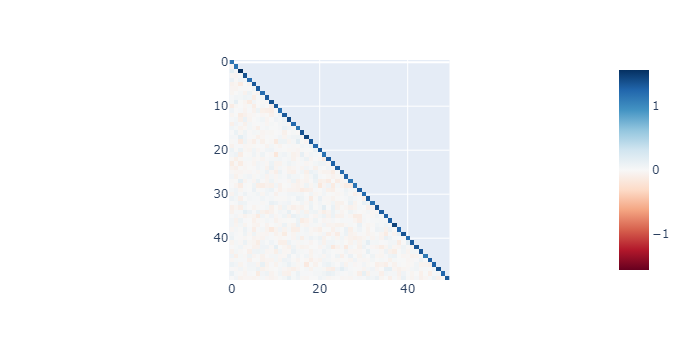

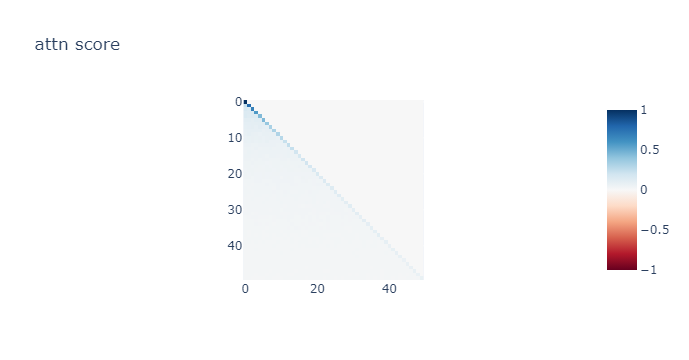

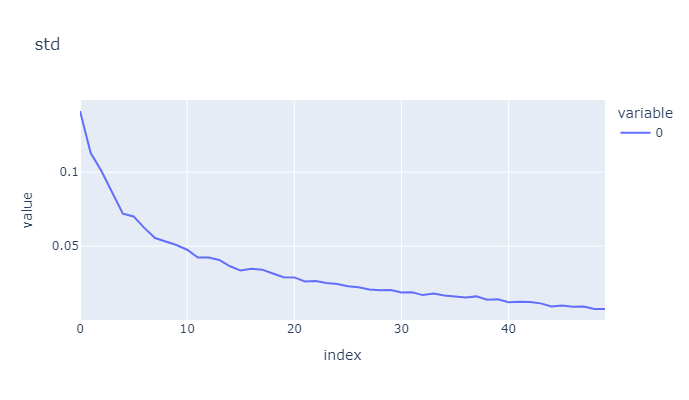

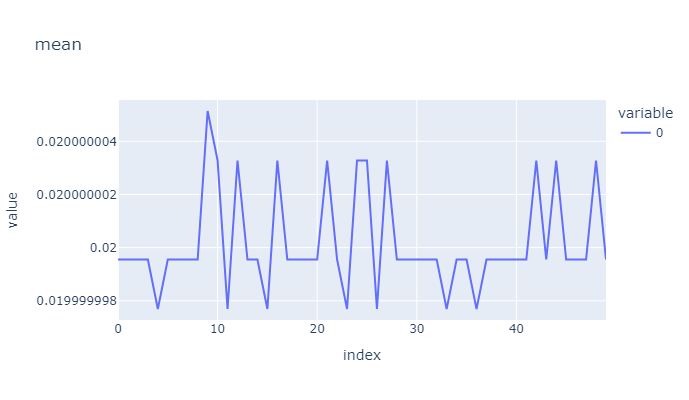

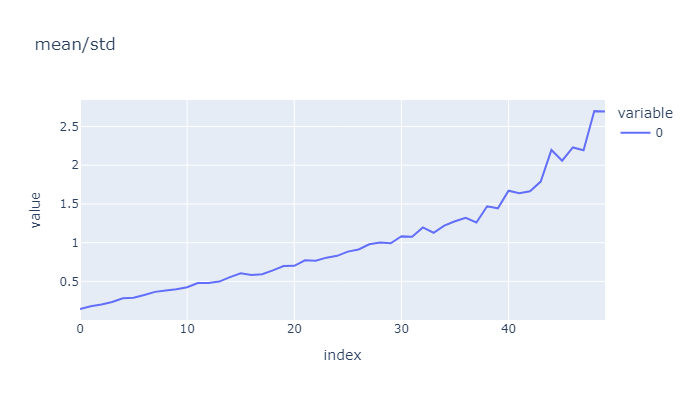

...

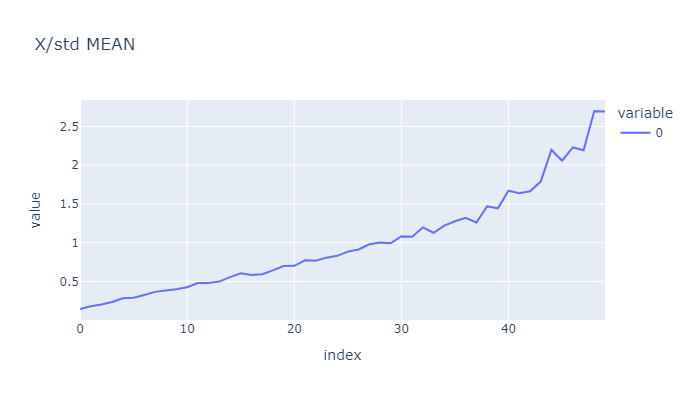

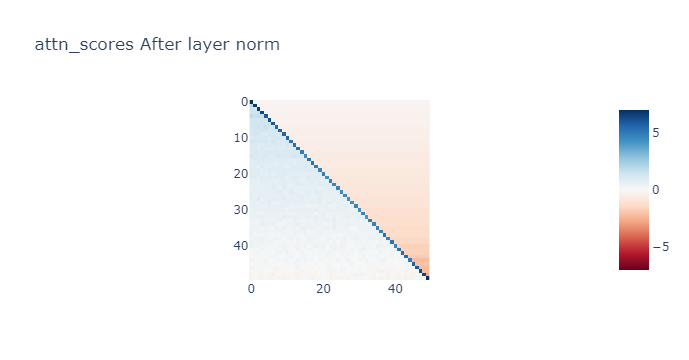

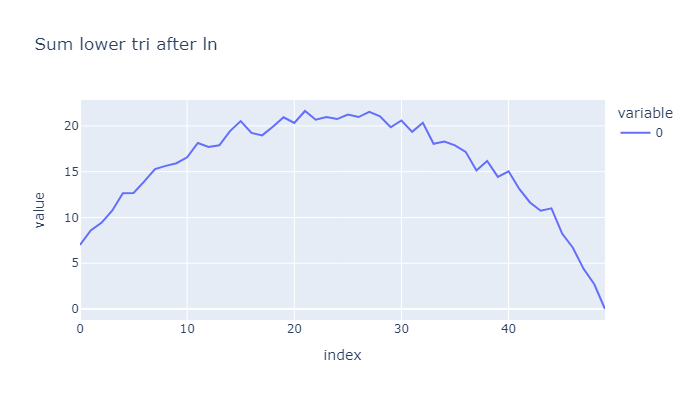

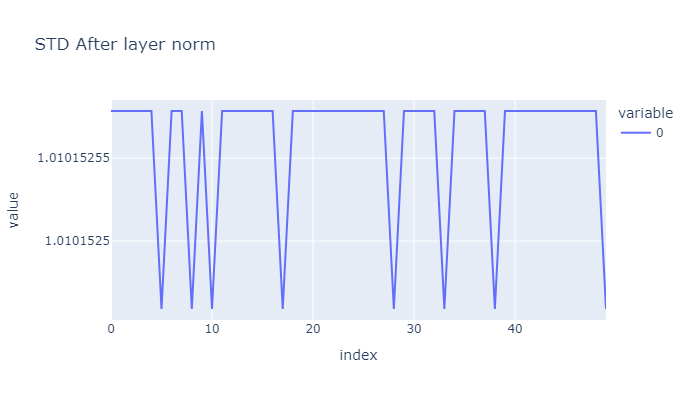

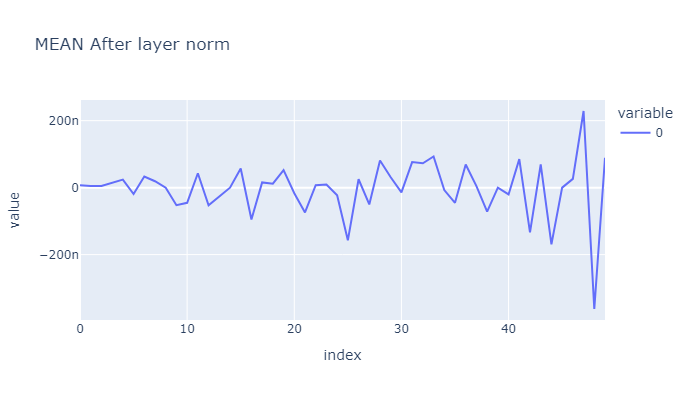

0.05
####################################################################################################


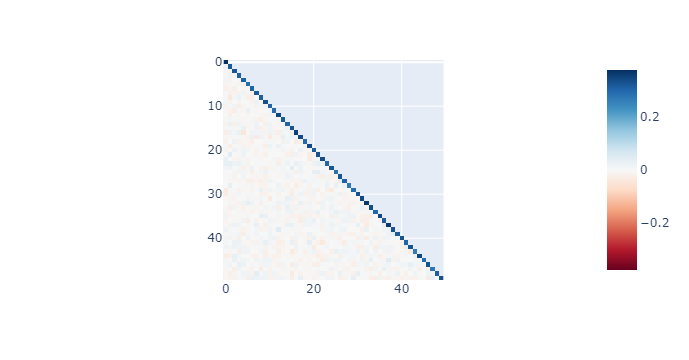

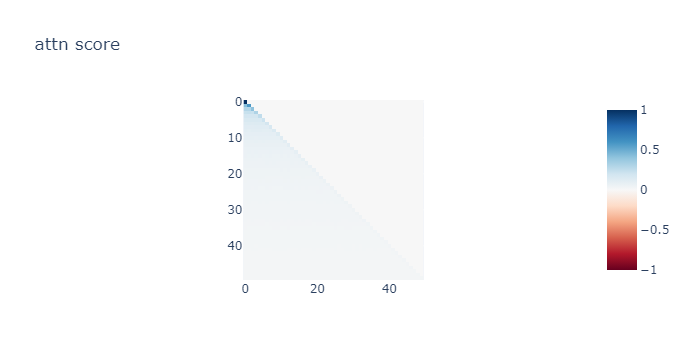

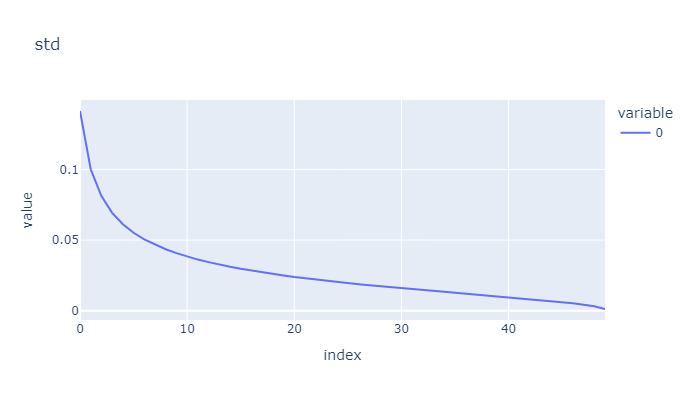

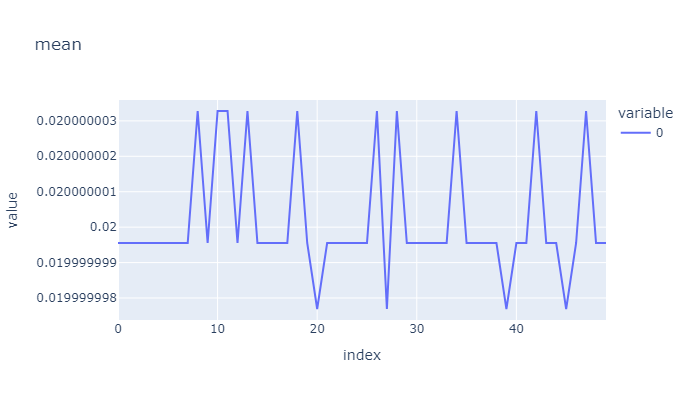

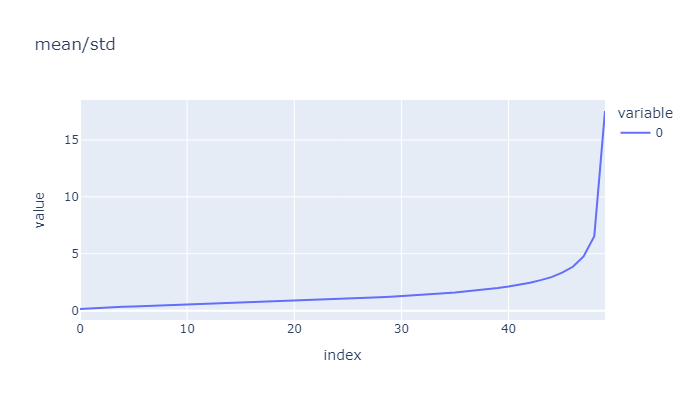

...

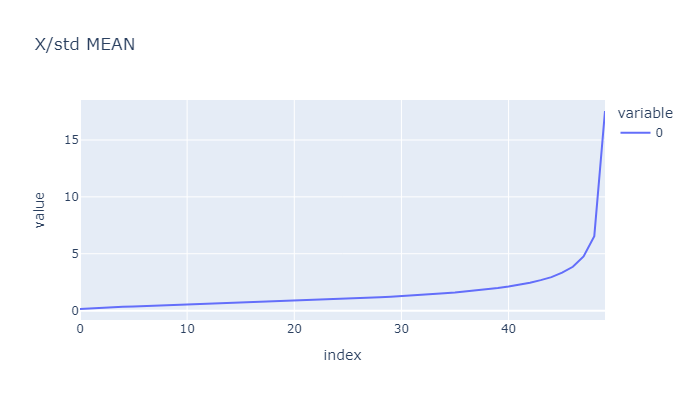

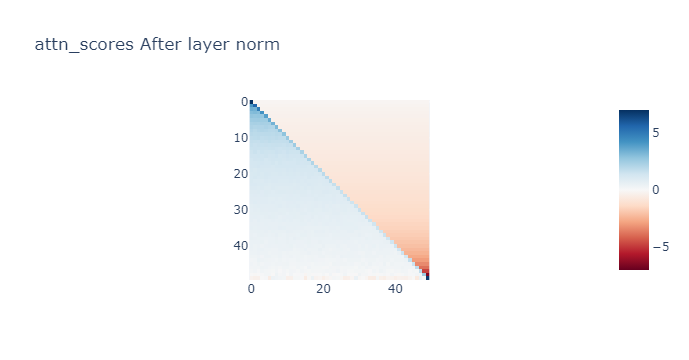

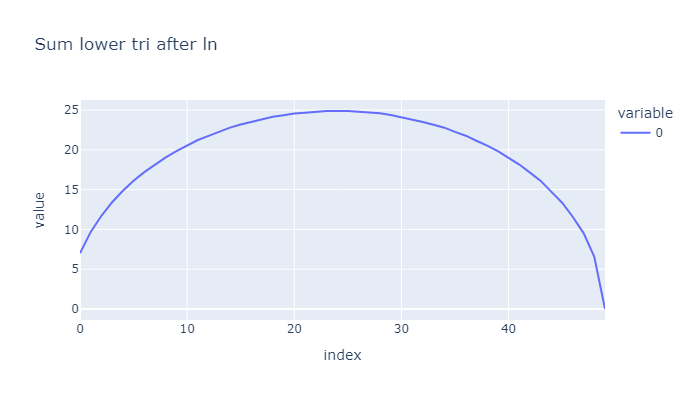

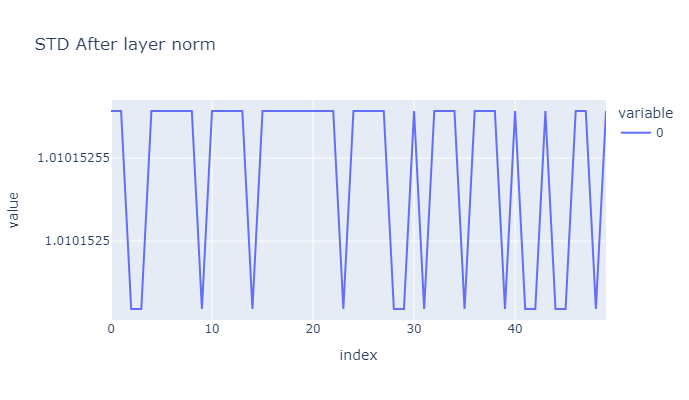

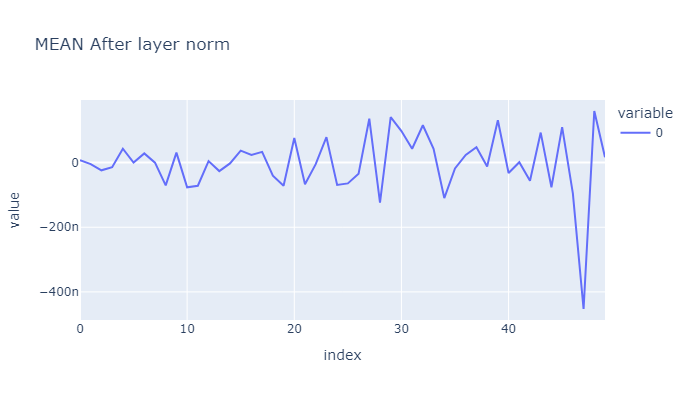

0.01
####################################################################################################


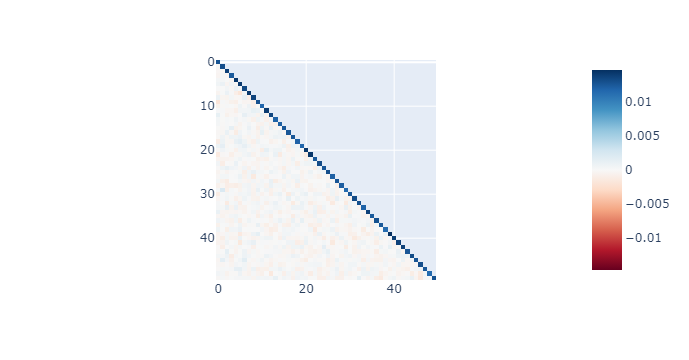

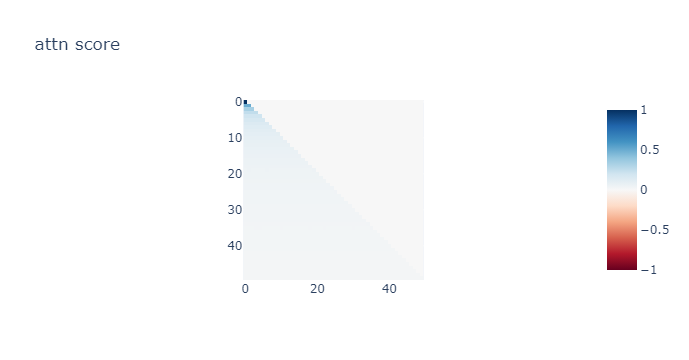

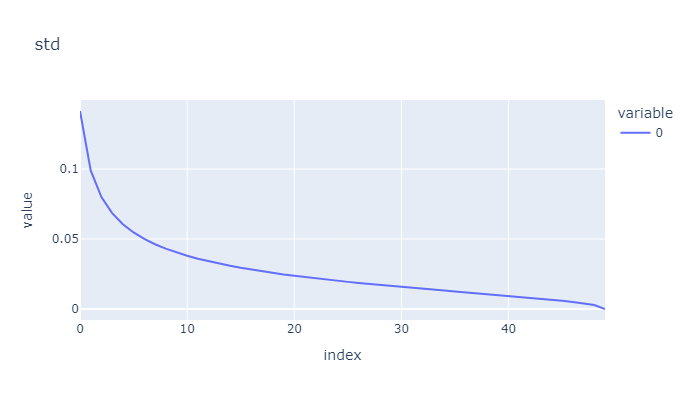

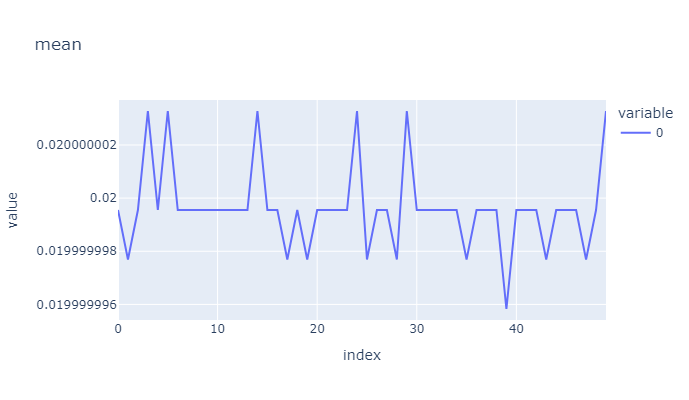

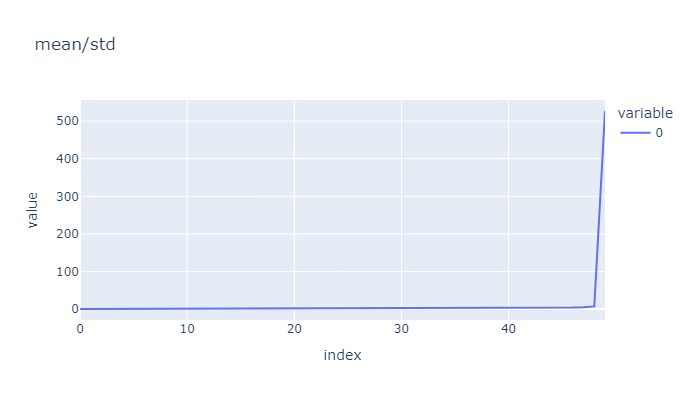

...

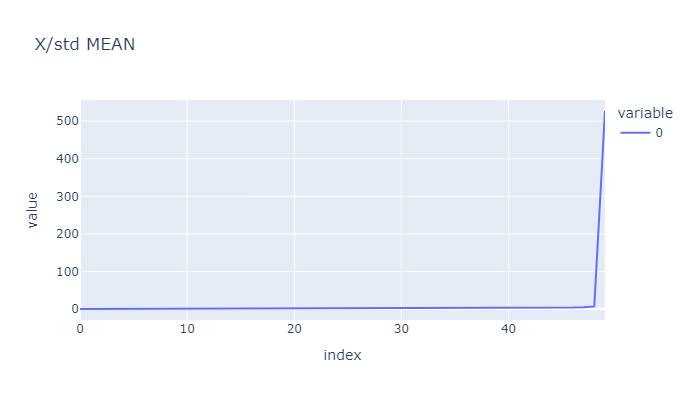

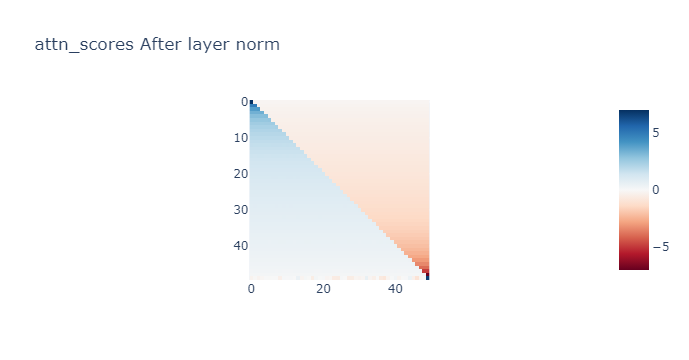

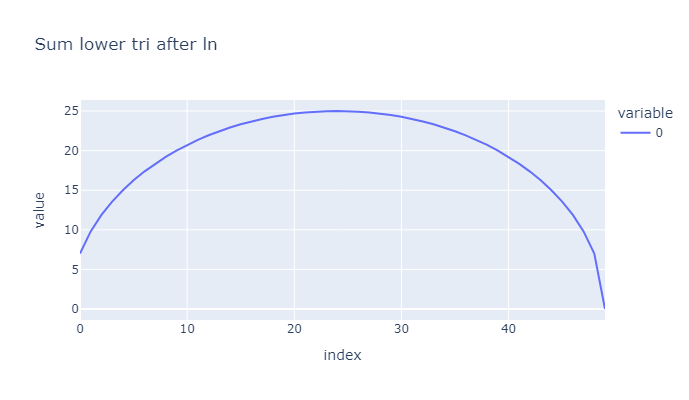

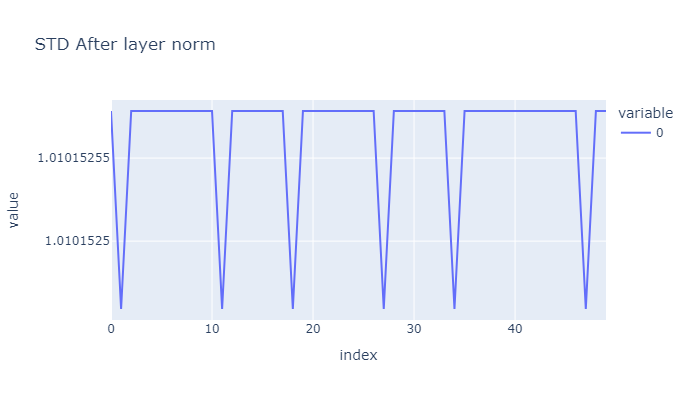

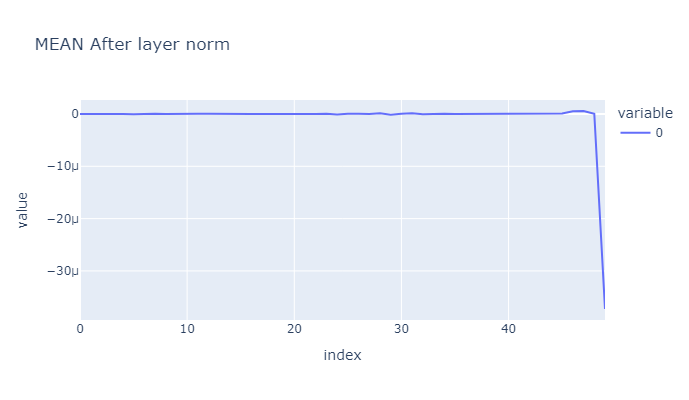

0.005
####################################################################################################


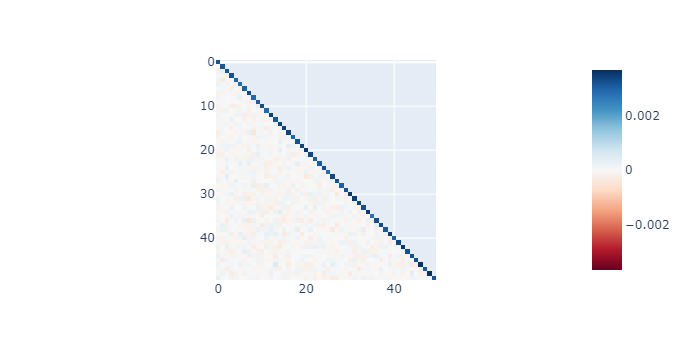

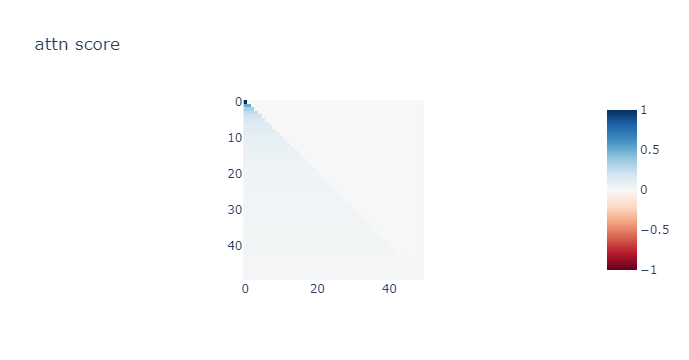

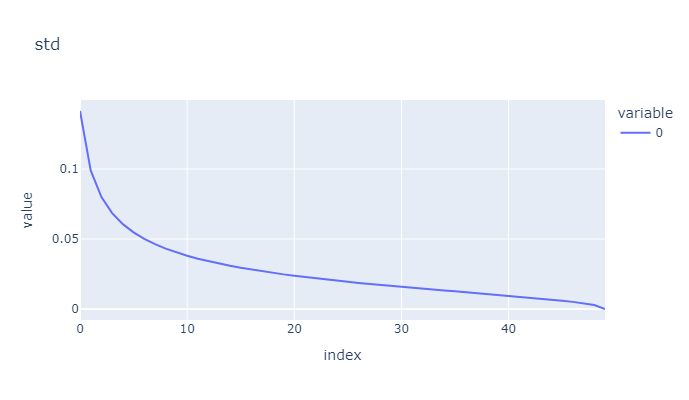

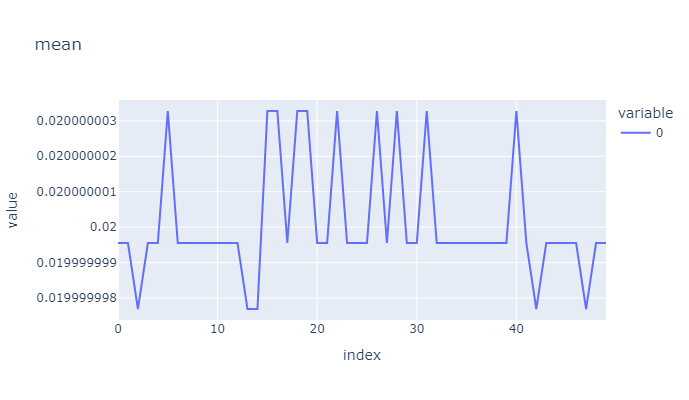

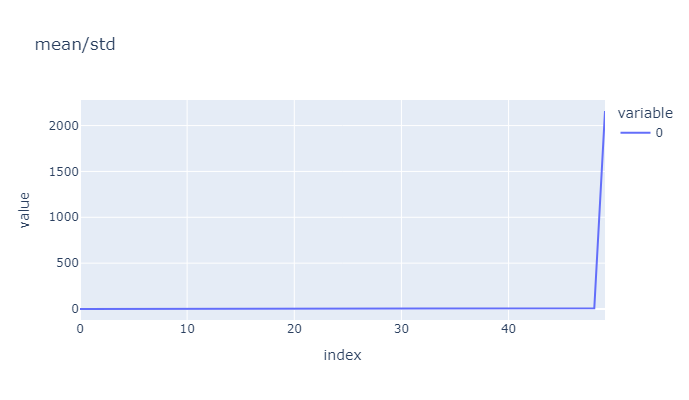

...

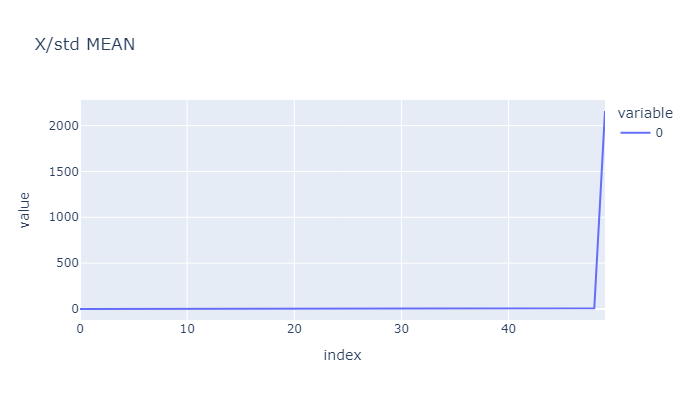

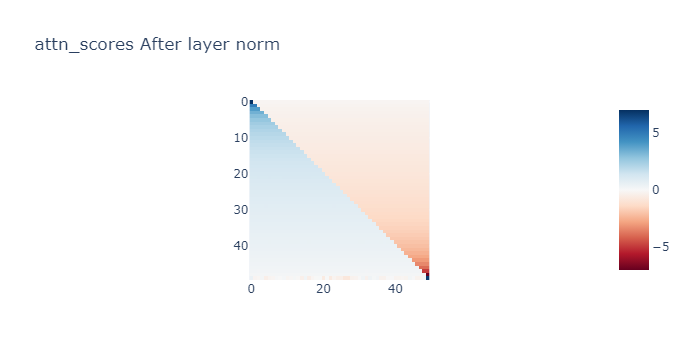

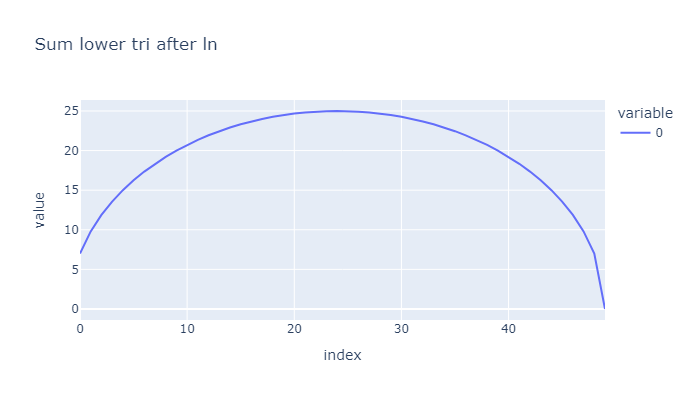

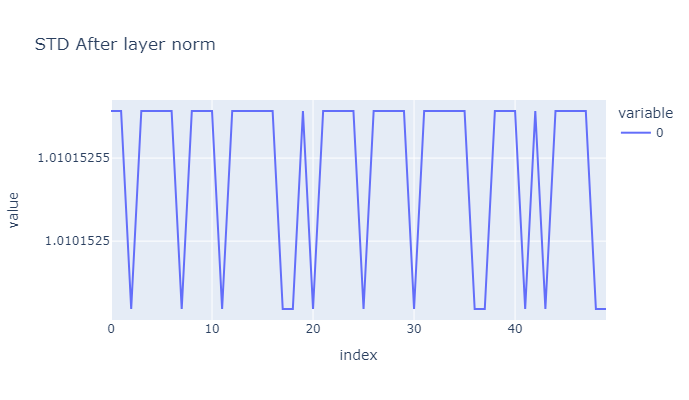

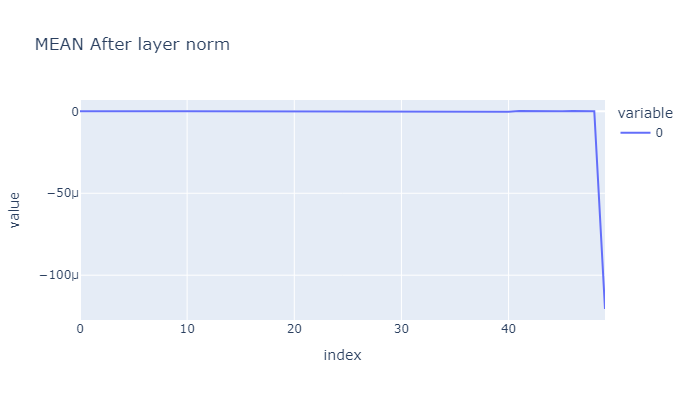

In [238]:
for std in [0.1, 0.05, 0.01, 0.005]:
    print(std)
    print('#'*100)
    a = torch.zeros(500, 50, 128)
    b = torch.zeros(500, 50, 128)
    a = torch.nn.init.normal_(a, mean=0, std=std)
    b = torch.nn.init.normal_(b, mean=0, std=std)
    
    # for i in range(0, 500):
    s = einops.einsum(a,a,'b p1 d1, b p2 d2 -> b p1 p2')
    cs = apply_causal_mask(s.mean(0))
    imshow(cs)
    attn_scores = cs.softmax(dim=-1)
    imshow(attn_scores, title='attn score')
    line(attn_scores.std(axis=1), title='std')
    line(attn_scores.mean(axis=1), title='mean')
    
    mean = attn_scores.mean(dim=-1, keepdim=True)
    std = attn_scores.std(dim=-1, keepdim=True, unbiased=False)
    
    line(mean / std, title='mean/std')
    imshow(attn_scores / std, title='X/std')
    line((attn_scores / std).std(axis=1), title='X/std STD')
    line((attn_scores / std).mean(axis=1), title='X/std MEAN')
    ln = (attn_scores - mean) / std
    imshow(ln, title='attn_scores After layer norm')
    line(ln.tril().sum(axis=1), title='Sum lower tri after ln')
    line(((attn_scores - mean) / std).std(axis=1), title='STD After layer norm')
    line(((attn_scores - mean) / std).mean(axis=1), title='MEAN After layer norm')

# Seq length of 1000

In [ ]:
for std in [0.001]:
    print(std)
    print('#'*100)
    a = torch.zeros(500, 1000, 50)
    b = torch.zeros(500, 1000, 50)
    a = torch.nn.init.normal_(a, mean=0, std=std)
    b = torch.nn.init.normal_(b, mean=0, std=std)
    
    # for i in range(0, 500):
    s = einops.einsum(a,a,'b p1 d1, b p2 d2 -> b p1 p2')
    cs = apply_causal_mask(s.mean(0))
    imshow(cs)
    attn_scores = cs.softmax(dim=-1)
    imshow(attn_scores, title='attn score')
    line(attn_scores.std(axis=1), title='std')
    line(attn_scores.mean(axis=1), title='mean')
    
    mean = attn_scores.mean(dim=-1, keepdim=True)
    std = attn_scores.std(dim=-1, keepdim=True, unbiased=False)
    
    line(mean / std, title='mean/std')
    imshow(attn_scores / std, title='X/std')
    line((attn_scores / std).std(axis=1), title='X/std STD')
    line((attn_scores / std).mean(axis=1), title='X/std MEAN')
    ln = (attn_scores - mean) / std
    imshow(ln, title='attn_scores After layer norm')
    line(ln.tril().sum(axis=1), title='Sum lower tri after ln')
    line(ln.tril().sum(axis=1).sqrt(), title='Sqrt(Sum) lower tri after ln')
    line(((attn_scores - mean) / std).std(axis=1), title='STD After layer norm')
    line(((attn_scores - mean) / std).mean(axis=1), title='MEAN After layer norm')

0.001
####################################################################################################
